<center>
    <h1> INF285 - Computación Científica </h1>
    <h2> Tarea 2 - Código Base</h2>
    <h2> [S]cientific [C]omputing [T]eam </a> </h2>
    <h2> Version: 1.00</h2>
</center>

# No debe utilizar bibliotecas adicionales.

In [123]:
import numpy as np
import IPython
import time
import random
from scipy.io import wavfile
from scipy.signal import stft
from scipy.signal import istft
from scipy import linalg
from ipywidgets import interact
import pandas as pd
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

random.seed(0)

## Funciones&nbsp;entregadas:

In [124]:
# Firma función 1
# Esta función de no debe ser modificada.
def WAV_to_Array(WAV_file, noise):
    """
    Parameters
    ----------
    WAV_file             : string 
                           WAV path
    noise                : boolean
                           flag for adding noise to sample

    Returns
    -------
    sample_rate          : int
                           Number of samples per second of the WAV file
    data                 : 1-D array                                       
                          NumPy array with WAV file data                   
    """                                                                    
    sample_rate, data = wavfile.read(WAV_file)
    if(len(data.shape) > 1): # En caso de que tenga más de un canal de audio, se trabaja con el primero
        data = data[:,0]
    data = data[:sample_rate*10]
    if noise:
        data = data + 0.01*np.asarray(random.sample(range(len(data)),len(data)))
    return sample_rate, data

# Firma función 2
# Esta función de no debe ser modificada.
def play_audio(data, sample_rate):
    """
    Parameters
    ----------
    data            : 1-D array                                       
                    NumPy array with WAV file data
    sample_rate     : int
                    Number of samples per second of the WAV file
    
    """
    IPython.display.display(IPython.display.Audio(data, rate=sample_rate))
    return

In [125]:
# Ejemplo practico  cargada  y reproduccion de audio:
filename = "output/song_1/other_noise.wav"
sample_rate_normal, data_normal = WAV_to_Array(filename, False)
sample_rate_noise, data_noise = WAV_to_Array(filename, False)
print("Audio normal:")
play_audio(data_normal , sample_rate_normal)
print("Audio con ruido:")
play_audio(data_noise , sample_rate_noise)

Audio normal:


Audio con ruido:


In [126]:
# Firma función 3
# Esta función de no debe ser modificada.
def STFT(data):
    """
    Parameters
    ----------
    data                 : 1-D array                                      
                          NumPy array with WAV file data
    Returns
    -------
    M                : (p, q) array
                       M complex matrix
    """
    _, _, M = stft(data)
    return M

# Firma función 4    
# Esta función de no debe ser modificada.
def ISTFT(M):
    """
    Parameters
    ----------
    M                : (p, q) array
                       M complex matrix
    Returns
    -------
    data             : 1-D array                                      
                        NumPy array with WAV file data
    """
    _, data = istft(M)
    return data

# Firma función 5
# Esta función de no debe ser modificada.
def Split(M):
    """
    Parameters
    ----------
    M                : (p, q) array
                       M complex matrix
    Returns
    -------
    M_Re             : (p, q) array
                       M_Re real matrix
    M_Im             : (p, q) array
                       M_Im real matrix
    """
    M_Re = M.real
    M_Im = M.imag
    return M_Re, M_Im

# Firma función 6
# Esta función de no debe ser modificada.
def Merge(M_Re, M_Im):
    """
    Parameters
    ----------
    M_Re             : (p, q) array
                       M_Re real matrix
    M_Im             : (p, q) array
                       M_Im real matrix
    Returns
    -------
    M                : (p, q) array
                       M complex matrix
    """
    M = M_Re + 1j*M_Im 
    return M

## Funciones&nbsp;a&nbsp;implementar:

In [127]:
# Firma función 7
def PCA_SVD(M, m):
    """
    Parameters
    ----------
    M             : (p, q) array
                    M real matrix
    m              : int
                    Number of components
    Returns
    -------
    V             : (q, m)-array
                     first m principal components
    Y              : (p,m)-array
                     Principal Component Coefficients
    mu             : (q)-array
                     Average per column 
    """
    n_col= len(M[0]) #Cantidad de columnas (q)
    n_fil= len(M[:,0]) #Cantidad de filas (p)
    mu = np.empty(n_col, dtype=float)

    for i in range(0, n_col):
        mu[i] = np.mean(M[:,i])
    Z = M - mu
    
    _, s, V_trans = linalg.svd(Z, full_matrices=False)
    V = np.transpose(V_trans)
    
    L=[]
    for row in range (len(V)):
        L2 = []
        for col in range(m):
            L2.append(V[row][col])
        L.append(L2)
    V = np.array(L)
    
    Y = np.dot(Z,V)
        
    return V, Y, mu

# Firma función 8
def PCA_M(V, Y, mu):
    """
    Parameters
    ----------
    V              : (q, m)-array
                     first m principal components
    Y              : (p,m)-array
                     Principal Component Coefficients 
    mu             : (q)-array
                     Average per column 
    Returns
    -------
    Mm              : (p, q)-array
                     "Modified" M
    """
    V_t = np.transpose(V)
    M = np.dot(Y,V_t) + mu
    return M

# Firma función 9
def calc_compression_ratio(data_length, M_shape, m1, m2):
    """
    Parameters
    ----------
    data_length          : length of 1-D array                                      
                          Length of the original NumPy array with WAV file data
    M_shape              : tuple
                          Complex M matrix Dimensions
    m1                   : int
                          Number of components to reduce M_Re real matrix
    m2                   : int
                          Number of components to reduce M_Im real matrix
    Returns
    -------
    compression_ratio  : Float
                         Compression ratio
    """
    p, q = M_shape
    comp_real = q*m1 + p*m1 + q
    comp_imag = q*m2 + p*m2 + q
    memory_comp = comp_real + comp_imag
    
    compression_ratio = (1-(memory_comp/data_length))*100
    
    return compression_ratio

# Firma función 10
def compression_algorithm(data, m1, m2):
    """
    Parameters
    ----------
    data               : 1-D array                                      
                       NumPy array with WAV file data
    m1                 : int
                       Number of components to reduce M_Re real matrix
    m2                 : int
                       Number of components to reduce M_Im real matrix

    Returns
    -------
    V1             : (q, m)-array
                     first m principal components from M_Re
    Y1              : (p,m)-array
                     Principal Component Coefficients from M_Re
    mu1            : (q)-array
                     Average per column from M_Re
    V2             : (q, m)-array
                     first m principal components from M_Im
    Y2              : (p,m)-array
                     Principal Component Coefficients from M_Im
    mu2             : (q)-array
                     Average per column from M_Im
                
    """
    
    M = STFT(data)
    M_Re, M_Im = Split(M)
    V1, Y1, mu1 = PCA_SVD(M_Re, m1)
    V2, Y2, mu2 = PCA_SVD(M_Im, m2)
    
    return V1, Y1, mu1, V2, Y2, mu2

# Firma función 11
def decompression_algorithm(V1, Y1, mu1, V2, Y2, mu2):
    """
    Parameters
    ----------
    V1             : (q, m)-array
                     first m principal components from M_Re
    Y1              : (p,m)-array
                     Principal Component Coefficients from M_Re
    mu1            : (q)-array
                     Average per column from M_Re
    V2             : (q, m)-array
                     first m principal components from M_Im
    Y2              : (p,m)-array
                     Principal Component Coefficients from M_Im
    mu2             : (q)-array
                     Average per column from M_Im

    Returns
    -------
    data_modified   : 1-D array                                      
                      NumPy array with WAV file data
    """
    M_Re_desc = PCA_M(V1, Y1, mu1)  #decomprimido
    M_Im_desc = PCA_M(V2, Y2, mu2)  #decomprimido
    Mm = Merge(M_Re_desc, M_Im_desc)
    data_modified = ISTFT(Mm)
    
    return data_modified

## Experimentación

### El buen funcionamiento de la siguiente sección es un indicador de que su código funciona correctamente

In [128]:

noise_reduction_attempts = [
    (1, 1),
    (5, 5),
    (10, 10),
    (20, 20),
    (30, 30),
    (45, 45),
    (55, 55),
    (65, 65),
    (75, 75),
    (85, 85),
    (95, 95),
    (100, 100)
]


def build_estimates(signal, noise_signal, n1_components, n2_components):
    M = STFT(signal)
    ratio = calc_compression_ratio(len(signal), M.shape, n1_components, n2_components)
    V1, Y1, mu1, V2, Y2, mu2 = compression_algorithm(noise_signal, n1_components, n2_components)
    signal_modified = decompression_algorithm(V1, Y1, mu1, V2, Y2, mu2)[:len(signal)]
    signal_Normalized = signal/linalg.norm(signal)
    signal_modified_Normalized = signal_modified/linalg.norm(signal_modified)
    error = np.linalg.norm(signal_Normalized - signal_modified_Normalized)
    mse = mean_squared_error(signal_Normalized, signal_modified_Normalized)
    return n1_components, ratio, error, mse, signal_modified

pca_compression_results = pd.DataFrame([
        build_estimates(data_normal, data_noise, n1, n2)
        for n1, n2 in noise_reduction_attempts
    ])
pca_compression_results.columns = ["Number of components", "Compression ratio", "error", "MSE", "Reconstructed signal"]
pca_compression_results

,Number of components,Compression ratio,error,MSE,Reconstructed signal
0,1,96.814966,0.760918,1.312917e-06,"[1197.8716414031128, 1322.6625858704563, 1405...."
1,5,90.327891,0.368926,3.086315e-07,"[1199.2836611522898, 1415.448949790066, 1599.6..."
2,10,82.219048,0.282230,1.806211e-07,"[1189.9388379167297, 1523.322658167386, 1819.7..."
3,20,66.001361,0.251059,1.429270e-07,"[1911.477229342186, 680.6435619802421, 1931.02..."
4,30,49.783673,0.221549,1.113017e-07,"[2790.661855915827, 326.6416145238986, 1330.30..."
5,45,25.457143,0.171478,6.667709e-08,"[2832.166013314916, 247.34904061077597, 989.28..."
6,55,9.239456,0.129690,3.813952e-08,"[2938.974756675174, 221.93625657401967, 983.66..."
7,65,-6.978231,0.076766,1.336270e-08,"[2912.8001343777946, 190.77808070621387, 954.4..."
8,75,-23.195918,0.029076,1.917063e-09,"[2887.63212729071, 211.7524975445944, 952.5516..."
9,85,-39.413605,0.010847,2.668193e-10,"[2885.95350826938, 210.39955946916973, 958.680..."


In [129]:
print("Audio normal:")
play_audio(data_normal , sample_rate_normal)
print("Audio con ruido:")
play_audio(data_noise , sample_rate_noise)

Audio normal:


Audio con ruido:


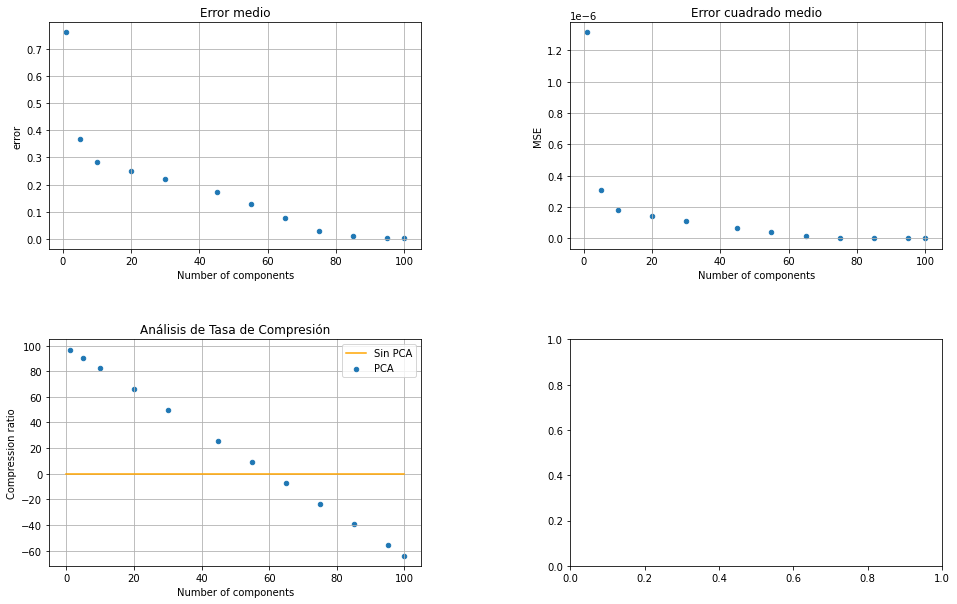

In [130]:
fig, ax = plt.subplots(figsize=(16,10),ncols=2, nrows=2)

## Graficar distintos tipos de errores
pca_compression_results.plot("Number of components", "error", "scatter", title='Error medio', ax=ax[0,0])
pca_compression_results.plot("Number of components", "MSE", "scatter", title='Error cuadrado medio', ax=ax[0,1])
pca_compression_results.plot("Number of components", "Compression ratio", "scatter", title='Análisis de Tasa de Compresión', ax=ax[1,0], label='PCA')
ax[1,0].plot([0,100], [0,0],'-', label='Sin PCA', color="orange")
# plt.plot(j, all_compressions_rates[j],'r.',ms=10)
ax[1,0].legend()
ax[0,0].grid(True)
ax[0,1].grid(True)
ax[1,0].grid(True)
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()


In [131]:
for reduced in pca_compression_results["Reconstructed signal"][:5]:
    play_audio(reduced , sample_rate_noise)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=65d1da02-617f-4545-8a92-006e4409c46c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>